# Computer Vision Final Project: Hand Gestures to Music
#### Assad Aijazi
#### Branden Kim

The goal of this project is to create an image classifier that can recognize hand gestures, and play different musical notes based on what hand gesture the classifier sees. To accomplish this, we took a dataset of hand gestures and used it to train a Convolutional Neural Network that can classify an image of hand into a gesture class. Then, we mapped the gesture class into a musical note. The end result is the ability to upload a video of hand gestures, and the program will output different musical melodies based on the sequence of hand gestures you make.



# **Section 1: Data Preprocessing**
First, we obtain all of the data we need to train our model. The source of the dataset is https://www.kaggle.com/gti-upm/leapgestrecog/version/1/. The data is segmented across 10 different zip files, 00.zip, 01.zip .. 09.zip for ease of loading into Google Colab (you can usually do two a time by dragging them both at the same time). Each Zip file contains 200 images of 7 classes of hand gestures: 'palm', 'L', 'fist', 'thumb', 'index', 'ok', and 'c'. The original dataset had several additional classes that were removed because we thought they were too difficult to classify.

**Provided files:**  
00.zip  
01.zip  
02.zip  
03.zip  
04.zip  
05.zip  
06.zip  
07.zip  
08.zip  
09.zip  

In [1]:
# unzip data if necessary. This will unzip all data segments located in the
# same directly. If you only want to use a small segment, only drag the data
# segments you want into Google Colab, or move the other zips from the directory
# if you are running locally. Note when using Google Colab you may have to load the segments one at a time

!unzip -n 00.zip
!unzip -n 01.zip
!unzip -n 02.zip
!unzip -n 03.zip
!unzip -n 04.zip
!unzip -n 05.zip
!unzip -n 06.zip
!unzip -n 07.zip
!unzip -n 08.zip
!unzip -n 09.zip

Archive:  00.zip
Archive:  01.zip
Archive:  02.zip
Archive:  03.zip
Archive:  04.zip
Archive:  05.zip
Archive:  06.zip
Archive:  07.zip
Archive:  08.zip
Archive:  09.zip


Length of Dataset: 14000


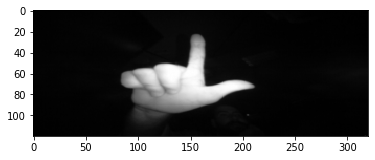

Label: L


In [2]:
import torch
from torchvision import datasets
from torchvision import transforms
from torch.utils.data import random_split, DataLoader, ConcatDataset
import matplotlib.pyplot as plt

# Scale down images by a factor of 2, and transform to Grayscale. We found
# that Grayscale worked better because then the classifier focused more on the 
# shape of the hand rather than the color of it.

preprocess = transforms.Compose(
    [
     transforms.Resize((120, 320)),
     transforms.Grayscale(),
     transforms.ToTensor(),
     ])

# load the data from each zip and concatenate them together. For testing 
# purposes, you can comment some of these out and use only a subset of 
# the data, which will speed up training time and the expense of accuracy

data0 = datasets.ImageFolder('00', preprocess)
data1 = datasets.ImageFolder('01', preprocess)
data2 = datasets.ImageFolder('02', preprocess)
data3 = datasets.ImageFolder('03', preprocess)
data4 = datasets.ImageFolder('04', preprocess)
data5 = datasets.ImageFolder('05', preprocess)
data6 = datasets.ImageFolder('06', preprocess)
data7 = datasets.ImageFolder('07', preprocess)
data8 = datasets.ImageFolder('08', preprocess)
data9 = datasets.ImageFolder('09', preprocess)

# Example: Uncomment to use a fifth of the data for testing purposes
# data = ConcatDataset([data0, data1])

data = ConcatDataset([data0, data1, data2, data3, data4, data5, data6, data7, data8, data9])

print("Length of Dataset:", len(data))

# split data into 80% training and 20% testing
lengths = [int(len(data)*0.8), int(len(data)*0.2)]

# set random seed for consistency
torch.manual_seed(0)
train_data, test_data = random_split(data, lengths)

# batch size for training and testing. We found that 64 works best
batch_size = 64

# data loaders for training and testing data
trainLoader = DataLoader(train_data, batch_size = batch_size, 
                         shuffle = True, num_workers = 0)
testLoader = DataLoader(test_data, batch_size = batch_size, 
                         shuffle = True, num_workers = 0)

x, y = iter(trainLoader).next()

# Example of an image in the training set
plt.imshow(transforms.ToPILImage()(x[0]), cmap='gray');
plt.show()

imageClasses = ['palm', 'L', 'fist', 'thumb', 'index', 'ok', 'c']
print('Label:', imageClasses[y[0]])

# **Section 2: Model Definition**
We tried two different models to build our classifier for our images, AlexNet and LeNet. While LeNet worked ok on data from the dataset, it struggled to classify images that were taken outside of the dataset. We thus used AlexNet as our main classifier.

In [0]:
from tqdm import tqdm as tqdm
import torch.nn as nn
import torch.optim as optim
import torch
import time
from torch.utils import data
import torch.nn.functional as F

# A modified version of the AlexNet Convolutional Neural Network, which is
# very similar to the one used by PyTorch. Several changes were made to use for
#  our specific dataset. We changed the input channels
# to one so that it could work on Grayscale images. We also changed the output
# channels to 7 to fit our dataset. We also removed all dropout layers, as
# we were having issues of the model not training fast enough
class AlexNet(nn.Module):

    def __init__(self):
        super(AlexNet, self).__init__()
        self.reset_parameters()
        self.features = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=11, stride=4, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(64, 192, kernel_size=5, padding=2),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
            nn.Conv2d(192, 384, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(384, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=3, stride=2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((6, 6))
        self.classifier = nn.Sequential(
            nn.Linear(256 * 6 * 6, 4096),
            nn.ReLU(inplace=True),
            nn.Linear(4096, 1000),
            nn.ReLU(inplace=True),
            nn.Linear(1000, 7),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = torch.flatten(x, 1)
        x = self.classifier(x)
        return x

    def reset_parameters(self):
      for m in self.modules():
          if isinstance(m, nn.Conv2d):
              nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
          elif isinstance(m, nn.BatchNorm2d):
              nn.init.constant_(m.weight, 1)
              nn.init.constant_(m.bias, 0)

In [0]:
# LeNet model that was used in class, kept here as a reference
class LeNet(nn.Module):
    def __init__(self):
        super(LeNet, self).__init__()
        
        # Convolutional layers.
        self.conv1 = nn.Conv2d(1, 6, 5)
        self.conv2 = nn.Conv2d(6, 16, 5)
        
        # Linear layers.
        self.fc1 = nn.Linear(33264, 120)
        self.fc2 = nn.Linear(120, 84)
        self.fc3 = nn.Linear(84, 7)

    def forward(self, x):
        # Conv1 + ReLU + MaxPooling.
        out = F.relu(self.conv1(x))
        out = F.max_pool2d(out, 2)
        
        # Conv2 + ReLU + MaPooling.
        out = F.relu(self.conv2(out))
        out = F.max_pool2d(out, 2)
        
        # This flattens the output of the previous layer into a vector.
        out = out.view(out.size(0), -1) 
        # Linear layer + ReLU.
        out = F.relu(self.fc1(out))
        # Another linear layer + ReLU.
        out = F.relu(self.fc2(out))
        # A final linear layer at the end.
        out = self.fc3(out)
       
        # We will not add nn.LogSoftmax here because nn.CrossEntropy has it.
        # Read the documentation for nn.CrossEntropy.
        return out

# **Section 3: Training the Model**
Here we define the method for training the model, define the criterion and the optimizer, and define all parameters that need to be defined. The end result shows that AlexNet is very effective on the dataset.

In [0]:
def train_model(classifier, criterion, optimizer, 
                trainLoader, valLoader, n_epochs,
                training_accuracy, training_loss,
                validation_loss, validation_accuracy):
  classifier.train()
  classifier.cuda()

  # Training loop starts.
 

  for epoch in range(n_epochs):
    correct = 0
    cumloss = 0
    for i, data in enumerate(trainLoader, 0):
      inputs, labels = data[0].cuda(), data[1].cuda()
      # print(inputs.shape)
      optimizer.zero_grad()
      outputs = classifier(inputs).cuda()
      loss = criterion(outputs, labels).cuda()
      loss.backward()
      optimizer.step()
      with torch.no_grad():  # Stop recording operations for gradient computation.
        # Count the number of correct predictions on this batch.
        _, max_labels = outputs.max(1)   # Extract the max values from yhat.
        # Check if those match the correct values in y.
        # and store in cumulative variable of correct values so far during training.
        correct += (max_labels == labels).sum().item() 
        # Also compute the cumulative loss so far during training.
        cumloss += loss.item()

    n = len(train_data)
    print('({0}) Training: loss = {1:.4f}, accuracy = {2:.4f}'
    .format(epoch, cumloss / n, correct / n))
    training_loss.append(cumloss / n)
    training_accuracy.append(correct / n)

    #classifier.eval()
    correct = 0
    cumloss = 0
    # Compute accuracy on the test set.
    with torch.no_grad(): # Do not record operations for grad computation.
      for (i, (x, y)) in enumerate(valLoader):
        # Flatten the images in the batch to input to the classifier.
        # x = x.view(x.shape[0], 3 * 32 * 32)
        x = x.cuda()
        y = y.cuda()
        # Compute predictions under the current model.
        yhat = classifier(x)
        # print(yhat.exp()[0])

        # Check if those match the correct values in y.
        # and store in cumulative variable of correct values so far.
        _, max_labels = yhat.max(1)
        correct += (max_labels == y).sum().item()
        # Also compute the cumulative loss so far.
        cumloss += loss.item()
  
    n = len(test_data)
    print('({0}) Validation: loss = {1:.4f}, accuracy = {2:.4f}\n'
      .format(epoch, cumloss / n, correct / n))
    validation_loss.append(cumloss / n)
    validation_accuracy.append(correct / n)


In [0]:
# Definition of our network. Use either LeNet or AlexNet

# classifier = LeNet()
classifier = AlexNet()

#Definition of our loss.
criterion = nn.CrossEntropyLoss()

# Definition of optimization strategy.

# found to work best experimentally
learningRate = 0.015

# Adding momentum drastically improved accuracy of our AlexNet model
momentum = 0.9

optimizer = optim.SGD(classifier.parameters(), lr = learningRate, momentum = momentum)

num_epochs = 4

In [7]:
alex_ta = []
alex_tl = []
alex_vl = []
alex_va = []
train_model(classifier, criterion, optimizer, 
            trainLoader, testLoader, num_epochs,
            alex_ta, alex_tl, alex_vl, alex_va)

(0) Training: loss = 0.0302, accuracy = 0.1578
(0) Validation: loss = 0.0288, accuracy = 0.2200

(1) Training: loss = 0.0127, accuracy = 0.6863
(1) Validation: loss = 0.0006, accuracy = 0.9907

(2) Training: loss = 0.0006, accuracy = 0.9899
(2) Validation: loss = 0.0002, accuracy = 0.9979

(3) Training: loss = 0.0002, accuracy = 0.9979
(3) Validation: loss = 0.0000, accuracy = 0.9989



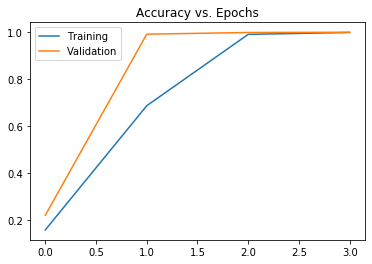

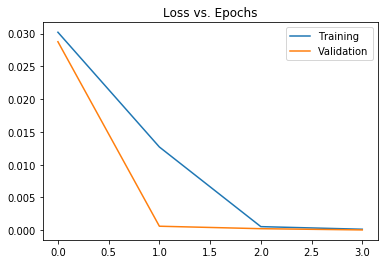

In [8]:
# Plot the accuracy and loss vs. Epochs
plt.figure()
plt.title('Accuracy vs. Epochs')
plt.plot(range(num_epochs), alex_ta, label='Training')
plt.plot(range(num_epochs), alex_va, label='Validation')
plt.legend()

plt.figure()
plt.title('Loss vs. Epochs')
plt.plot(range(num_epochs), alex_tl, label='Training')
plt.plot(range(num_epochs), alex_vl, label='Validation')
plt.legend()
plt.show()

# **Section 4: Testing on Real Images**
Here we test the model on actual images that were taken from a phone camera. 
We also define preprocessing so that the image looks as much like images in the
dataset as possible. The model is fairly limited here in that it only works well on images with large contrast between a light hand color and a dark background. But when the image does fit these criteria the classifier works quite well.

**Provided Examples:**  
test_hand8.jpg  
test_hand11.jpg  
test_hand13.jpg  
test_hand14.jpg  
test_hand15.jpg  
test_hand16.jpg  
test_hand17.jpg  
test_hand18.jpg  

In [0]:
from PIL import Image, ImageEnhance
import torchvision.transforms as transforms

#define a series of preprocessing steps

# perform preprocessing on image, including scaling, increasing contrast and brightness
# using thresholding to make only the hand be in frame

def preprocess_img(im):
  im = im.convert('LA')
  im = ImageEnhance.Contrast(im).enhance(4)
  im = ImageEnhance.Brightness(im).enhance(2)
  preprocessFn = transforms.Compose(
      [
      transforms.Resize((120, 200)),
      transforms.CenterCrop((120, 320)),
      transforms.Grayscale(),
      transforms.ToTensor()
      ])
  resize_im = preprocessFn(im)
  resize_im = (resize_im > 0.995) * resize_im
  
  return resize_im

Image before processing


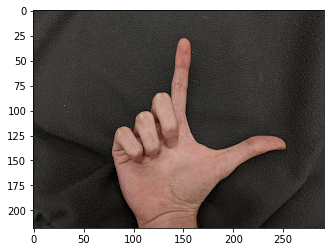

Image after processing


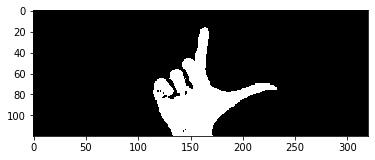

In [10]:
# Open one of the test images and process it
img = Image.open("test_hand18.jpg")

print('Image before processing')
plt.imshow(img)
plt.show()

proc_img = preprocess_img(img)
print('Image after processing')
plt.imshow(transforms.ToPILImage()(proc_img), cmap='gray')
plt.show()

In [11]:
# Classify the example and return the class probabilities
outputs = classifier(proc_img.unsqueeze(0).cuda()).cuda()

imageClasses = ['palm', 'L', 'fist', 'thumb', 'index', 'ok', 'c']
probs, indices = (-F.softmax(outputs.cpu(), dim = 1).data).sort()
probs = (-probs).numpy()[0][:7]; indices = indices.numpy()[0][:7]
preds = [imageClasses[idx] + ': ' + str(prob) for (prob, idx) in zip(probs, indices)]
print('\n'.join(preds))

L: 0.99999857
palm: 1.3819746e-06
thumb: 1.4275273e-12
index: 2.9286586e-13
ok: 1.3362108e-14
fist: 1.1921574e-15
c: 3.631632e-24


In [0]:
#takes in an image and returns the class index
def classify_img(im):
  outputs = classifier(im.unsqueeze(0).cuda()).cuda()
  _, indices = (-F.softmax(outputs.cpu(), dim = 1).data).sort()
  return indices[0][0]

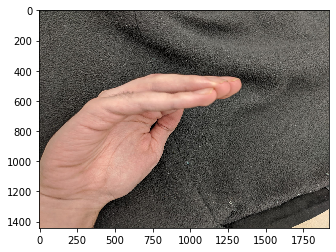

Label: c


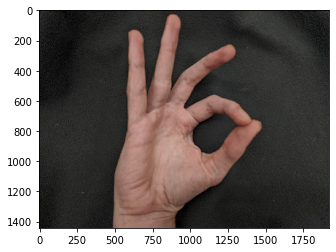

Label: ok


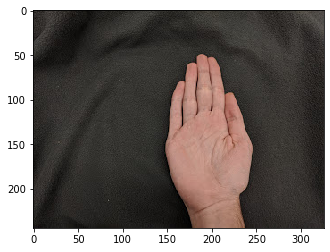

Label: palm


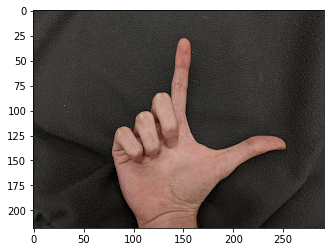

Label: L


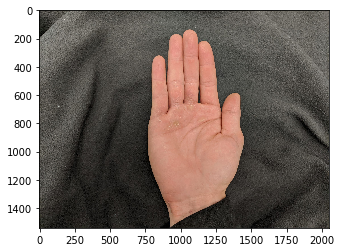

Label: palm


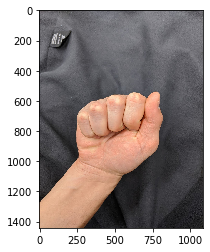

Label: index


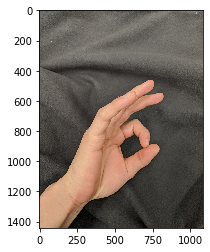

Label: ok


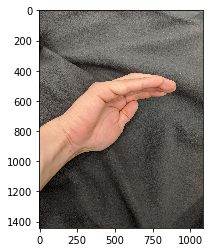

Label: index


In [13]:
imageClasses = ['palm', 'L', 'fist', 'thumb', 'index', 'ok', 'c']

# A few examples of good pictures, where there is large contrast between the hand
# and the background
good_examples = ['test_hand15.jpg', 'test_hand16.jpg', 'test_hand17.jpg', 'test_hand18.jpg']
for example in good_examples:
  img = Image.open(example)
  plt.imshow(img)
  plt.show()
  print('Label:', imageClasses[classify_img(preprocess_img(img))])

# a few examples of bad pictures, where the contrast between the hand and the background
# is not so good
bad_examples = ['test_hand8.jpg', 'test_hand11.jpg', 'test_hand13.jpg', 'test_hand14.jpg']
for example in bad_examples:
  img = Image.open(example)
  plt.imshow(img)
  plt.show()
  print('Label:', imageClasses[classify_img(preprocess_img(img))])

# **Section 5: Turning a Video of Gestures into Sounds**
Here we upload a video of hand gestures, process it frame by frame, and play
a different musical note corresponding to a different gesture.

**Dependencies**:  
Moviepy: video editing  
IPython: displaying Audio and Video    
**Provided Examples**:  
gesture_vid1.mp4  


In [14]:
# Code for playing audio

from IPython.display import Audio
import numpy as np

# list of frequencies to use for notes. The index corresponds to the index of
# the gesture classs
frequency_list = [262.0, 294.8, 327.5, 349.3, 393.0, 436.7, 491.2]

# return a signal that plays frequency f for t seconds
def gen_signal(f, t):
  rate = 3000
  L = t
  times = np.linspace(0,L,rate*L)
  signal = np.sin(2*np.pi*f*times)
  return signal


# Simple example:
# Loop through all of the frequencies and play each for half a second,
# then append all the signals to one
signal_list = []

for f in frequency_list:
  signal = gen_signal(f, 0.5)
  signal_list.append(signal)

signal = np.hstack(tuple(signal_list))

Audio(data=signal, rate=3000)

In [15]:
# Need to install these libaries for dealing with audio and video
!pip install moviepy

In [16]:
# An example of a video of gestures to convert into audio (takes a while to load)

import io
import base64
from IPython.display import HTML

video = io.open('gesture_vid1.mp4', 'r+b').read()

encoded = base64.b64encode(video)

HTML(data='''<video alt="test" height="300" controls>

<source src="data:video/mp4;base64,{0}" type="video/mp4" /> </video>'''.format(encoded.decode('ascii')))


In [17]:
from moviepy.editor import VideoFileClip

# opens a video that is iterable by frame
myclip = VideoFileClip('gesture_vid1.mp4')


# Section for converting video to audio
# Idea: Generate signals for contiguous blocks of the video, where every frame
# of the block is the same class.

# keeps track of the number of frames in the block
frames_active = 0

# keeps track of the class of the previous frame
prev_class = -1

# keeps track of the class of the previous frame
current_class = -1

# master list of all generated signals
signal_list = []

for frame in myclip.iter_frames(fps=30):
    im = Image.fromarray(frame)
    proc_im = preprocess_img(im)
    prev_class = current_class
    current_class = classify_img(proc_im)

    # if there is a change of image class, generate signal
    # for previous block and push it on to the master signal list
    if current_class != prev_class:
      # accounts for start of video
      if prev_class == -1:
        frames_active = 1
      else:
        # calculate duration of block by 1 / FPS * number of frames
        dur = (1/30) * frames_active
        signal = gen_signal(frequency_list[current_class], dur)
        signal_list.append(signal)
        frames_active = 1
    # Otherwise, increment the number of frames in the current block
    else:
      frames_active += 1


# account for end of video
dur = (1/30) * frames_active
signal = gen_signal(frequency_list[current_class], dur)

signal_list.append(signal)

# build final audio from signal list
signal = np.hstack(tuple(signal_list))
Audio(data=signal, rate=3000)


pygame 1.9.6
Hello from the pygame community. https://www.pygame.org/contribute.html
